# Reanalysis ERA5-Land-T MONTHLY data (from 1950 to present)
## Download, Mapping and time serie extraction (from Copernicus "Climate Data Store")
#### <font color="red"> Fonctionel en python 311 mais solution non trouvée dans les cellules 3, 7 et 8 pour afficher les cartes hvplot AVEC CONTOUR ET FOND DE PLAN
<font color="red">Avec évolution de Février 2023 (A AMELIORER EVENTUELLEMENT) pour adaptation au format ERA5-Land-T (Timely updated, NearRealTime = nouvelle dimension 'expver')
</font></font>
<br>
https://confluence.ecmwf.int/display/CUSF/ERA5+CDS+requests+which+return+a+mixture+of+ERA5+and+ERA5T+data

https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation

MONTHLY Precipitations, runoff, potential evaporation, evaporation, temperature and snow stock.

- Data: https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land-monthly-means?tab=overview
- ERA5-Land Data documentation: https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation


author: Loïc Duffar https://github.com/loicduffar

### How to PROCEED ?
Run cells by order:
- <a href=#section01>1)</a> Data download (only NetCDF format here, because more handy than GRIB format)
- 1bis) IF the ERA5 file is already downloaded, start by the 2nd cell instead of the 1rst one
- <a href=#section02>2)</a> Customization, initialization and display netCDF file infos
- <a href=#section03>3)</a> Plot annual and monthly interannual average maps (and save to files)
- <a href=#section04>4)</a> Plot monthly time series (for one pixel and for a possible polygon), and export them to excel file
- <a href=#section05>5)</a> Annual maps animation OPTIONNAL
- <a href=#section06>6)</a> Montlhy maps animation OPTIONNAL
- <a href=#section07>7)</a> Plot Maps over 12 months for a specific year (and one month map with basemap) OPTIONNAL
- <a href=#section08>8)</a> Elevation map OPTIONNAL

### How to AUTHORIZE the execution of the python code on Windows ? (only once)
https://cds.climate.copernicus.eu/api-how-to

- If you do not have an account, please register on the CDS registration page
- Log in
- Copy the <a href="https://cds.climate.copernicus.eu/api-how-to">code with your personal key</a> (see below), into the file "USER/.cdsapirc" (in Windows environment)
(The file starting with a dot can be created using Notepad: "File> Save as> Type: All files> File name: .cdsfapirc"

    url: https://cds.climate.copernicus.eu/api/v2     
    key: {uid}:{api-key}

###  How to CREDIT data ?
Where the Licensee communicates or distributes Copernicus Products to the public, the Licensee shall inform the recipients of the source by using the following or any similar notice:

"Generated using Copernicus Climate Change Service information [Year]"

### <a name=section01></a>1) Data download
- 1. customize the code below to choose the product (here 'monthly_averaged_reanalysis'), the parameter (e.g. 'total_precipitation', 'potential_evaporation' etc...), period of years, aera limits (lat/lon min and max) and file name (with the right extension grid or nc). 
- 2. Run the frist cell to download the file. The running time is displayed at the end of the process (You can view the job survey here: https://cds.climate.copernicus.eu/live/queue). NB: the server running time can be 6 minutes for 40 years and an area of 200x200 km.
- If the file is already downloaded, you don't need to download it again. Just edit and run the second cell, instead of the first one and process the data starting with the 3rd cell.

In [ ]:
"""
Created on Sept 2020
@author: Loïc Duffar
"""
import cdsapi
import timeit
import os

# +++++++ Customization
file_format = 'netcdf'  # 'grib' or 'netcdf' (but ONLY netcdf is supported by the code below for mapping and time serie extraction)
folder_nc = r'D:\A\Download\Hydro-Climato\CDS (Climate Data Store)\ERA5-Land'
folder_nc = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\PACA\Historiques spatialisés\_Concession'
folder_nc = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Climat Monde\CDS (Climate Data Store)\ERA5-Land MONTHLY averaged 7_variables'
folder_nc = r'C:\Users\martini\Documents\folder out\0_telechargement data a mettre dans X'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1950-2022 AMERIQUE SUD & CENTRALE (ERA5-Land-T).nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1981-2022 AFRIQUE.nc'
downloaded_file = 'ERA5-Land monthly averaged 7_variables 1981-2022 ASIE.nc'
# downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1950-2023 FRANCE PACA (ERA5-Land-T).nc'

# ....... AREA to extract
lon_min, lat_min, lon_max, lat_max =[79.71, 5.9, 81.88, 9.9]# SRI LANKA
lon_min, lat_min, lon_max, lat_max =[-74.5, 17.5, -68.3, 20.1]# HISPANIOLA
lon_min, lat_min, lon_max, lat_max =[-9.66, 35.37, 49.5, 71.55]# EUROPA
lon_min, lat_min, lon_max, lat_max =[ 31.9, -11.3,180., 60.5]# ASIA
lon_min, lat_min, lon_max, lat_max =[-25.2, -35.5, 55.95, 37.4]# AFRICA  # it takes around 0.5 hour
lon_min, lat_min, lon_max, lat_max =[-4.9, 41.2, 10., 51.14]# FRANCE
lon_min, lat_min, lon_max, lat_max =[102.1,8.5,109.5,23.4]# VIETNAM (Entire)
lon_min, lat_min, lon_max, lat_max =[-92.15, -56., -34.5, 25.5]# SOUTH & CENTRAL AMERICA + CARIBBEAN  # it takes around 1 hour


lon_min, lat_min, lon_max, lat_max =[ 31.9, -11.3,180., 60.5]# ASIA

# lon_min, lat_min, lon_max, lat_max =[4.6, 42.9, 7.55, 45.1]# FRANCE PACA

# ....... PERIOD to extract
start_year = 1981                                            # from 1950
end_year = 2023                                              # to present year

# ....... VARIABLE(S) to extract: single name or list of names among those below
#         - total_precipitation, surface_runoff,  runoff, snow_depth_water_equivalent (m)
#         - 2m_temperature (K)
#         - potential_evaporation, total_evaporation, evaporation_from_open_water_surfaces_excluding_ocean, evaporation_from_bare_soil (m negative) (m)
variables_list = ['total_precipitation',
                  'surface_runoff',
                  'snow_depth_water_equivalent',
                  '2m_temperature',
                  'potential_evaporation', 'total_evaporation', 'evaporation_from_open_water_surfaces_excluding_ocean',
                 ]

# +++++++ Download
years = [ str(start_year +i ) for i in range(end_year - start_year + 1)]                   
if not os.path.exists(folder_nc): os.mkdir(folder_nc)
downloaded_file = os.path.join(folder_nc, downloaded_file)

print('Process started. Please wait the ending message ... ')
start = timeit.default_timer()
c = cdsapi.Client()

c.retrieve(
    'reanalysis-era5-land-monthly-means',
    {
        'format': file_format,                                  
        'product_type': 'monthly_averaged_reanalysis',
        'variable': variables_list,                   
        'year': years,
        'month': [ '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12' ],
        'time': '00:00',
        'area': [ lat_min, lon_min, lat_max, lon_max ],
    }, downloaded_file
    )

stop = timeit.default_timer()
print('Process completed in ', (stop - start)/60, ' minutes')

### 1bis) Edit and run this cell, instead of the first one, ONLY IF the ERA5 file is already downloaded
- Enter the infos for the already donwloaded file (folder ans file name)

In [8]:
import os

# +++++++ Customization
folder_nc = r'\\Scp1\scp$\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\Rep Dominicaine\DONNEES ENTREE\Historiques spatialises'
folder_nc = r'D:\A\Download\Hydro-Climato\CDS (Climate Data Store)\ERA5-Land'
folder_nc = r'C:\Users\duffar\Documents\Climat du Monde\ERA5-Land'
folder_nc = r'C:\Users\martini\Documents\folder out\0_telechargement data a mettre dans X'
folder_out = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\Rep Dominicaine\DONNEES ENTREE\Historiques spatialises\ERA5'
folder_out = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\Tchad_Sahr\Historiques spatialisés\ERA5'
folder_out = r'C:\Users\DUFFAR\Documents\A\ETUDES\2022_Pluies_maillees_diverses\Enneigement Durance-Verdon'
folder_out = r'C:\Users\DUFFAR\Documents\A\ETUDES\2022_Pluies_maillees_diverses'
folder_out = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\PACA\Historiques spatialisés\_Verdon'
folder_out=r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\_Martini\Bosnie\HYDROCLIM\Resultats'

folder_nc = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Climat Monde\CDS (Climate Data Store)\ERA5-Land MONTHLY averaged 7_variables'

downloaded_file = 'ERA5 MONTHLY evaporation_from_open_water_surface HISPANIOLA 2081-2020.nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1981-2020 AMERIQUE SUD & CENTRALE.nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1950-2021 ASIE.nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1981-2021 AFRIQUE.nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1950-2022 FRANCE PACA_OLD.nc'
downloaded_file = 'ERA5-Land monthly averaged 7_variables 1950-2022 AMERIQUE SUD & CENTRALE (ERA5-Land-T).nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1950-2022 FRANCE PACA (ERA5-Land-T).nc'
downloaded_file = 'ERA5-Land MONTHLY averaged 7_variables 1981-2022 EUROPE (ERA5-Land-T).nc'

# +++++++ Initialisation
downloaded_file = os.path.join(folder_nc, downloaded_file)
print('Initialisation effectuée')

Initialisation effectuée


### <a name=section02></a>2) Customization, initialization and display netCDF file infos
- Define the variable and the geographic area to use (the file can contain more than one variable and a larger area) 
- Define a polygon file for average computation and a vector file for map wrapping (points, lines, polygons). The CRS of the files must be WGS84 (coordinate reference system)
- Define the coordinate (latitude, longitude) of the point for map plotting and time serie extraction (Obligatory for cell 4)
- Run the cell to display file infos

NB:
- The last year is not included in the average map (as it is often the current year wich is often incomplete)
- Currently works only for some parameters (see code below). For more parameters, the code below has to be adapted with the correct name in addition to "tp", "ro", "sd", "t2m", "pev", "e", "evaow", "evabs" etc...

In [9]:
import netCDF4
import xarray as xr
import rioxarray
import geopandas as gpd
import hvplot.xarray
import cartopy
import numpy as np
print('Cartopy version: ', cartopy.__version__)
print('Geopandas version: ', gpd.__version__)

# +++++++ Customization
# ------- Choose  the data (the file can contain more than one variable and a larger area)
# . . . . Choose one variable in the file
#                'total_precipitation', '2m_temperature','snow_depth_water_equivalent',
#                 'potential_evaporation', 'total_evaporation', 'evaporation_from_open_water_surfaces_excluding_oceans',
variable = 'total_precipitation'   
# . . . . Area clipping. [None, None, None, None] for no clipping 
lon_min, lat_min, lon_max, lat_max =[79.71, 5.9, 81.88, 9.9]# SRI LANKA
lon_min, lat_min, lon_max, lat_max =[-85.91, 7.81, -82.61, 11.31]# COSTA RICA
lon_min, lat_min, lon_max, lat_max =[8.5, 41.3, 9.55, 43.]# FRANCE Corsica
lon_min, lat_min, lon_max, lat_max =[-74.5, 17.5, -68.3, 20.1]# HISPANIOLA
lon_min, lat_min, lon_max, lat_max =[39.9, 9.8, 44.9, 13.6]# DJIBOUTI
lon_min, lat_min, lon_max, lat_max =[6.32, 32.72, 12.37, 37.41]# TUNISIE
lon_min, lat_min, lon_max, lat_max =[100.7, 12.3, 104.0, 14.4]# CAMBODGE RISD
lon_min, lat_min, lon_max, lat_max =[108.4,11.38,109.25,12.29]# VIETNAM (Ninh Thuan)
lon_min, lat_min, lon_max, lat_max =[15.2, 5.24, 19.0, 9.45]# TCHAD Bahr Sara
lon_min, lat_min, lon_max, lat_max =[-83.074, 7.167, -77.130, 9.72]# PANAMA
lon_min, lat_min, lon_max, lat_max =[4.6, 42.9, 7.55, 45.1]# FRANCE PACA
lon_min, lat_min, lon_max, lat_max =[15, 41.5, 21, 46] # Bosnie


# . . . . Point for map and time serie extraction
lat, lon = [7.7, 81.6]# SRI LANKA Batticaloa
lat, lon = [9.95, -84.1]# COSTA RICA San Jose
lat, lon = [18.3, -71.19]# REP DOMINICAINE Santa Cruz de Barahona
lat, lon = [18.8678, -70.7789]# REP DOMINICAINE Alto del Sillon
lat, lon = [18.4, -71.45]# REP DOMINICAINE Neyba (ONAMET)
lat, lon = [18.9044, -70.7236]# REP DOMINICAINE Constanza (Met.)
lat, lon = [43.5, 5.4]# FRANCE PACA Aix
lat, lon = [43.88, 5.41333]# FRANCE PACA Apt-Viton 
lat, lon = [43.96167, 5.78333]# FRANCE PACA Forcalquier
lat, lon = [42.46, 8.75]# FRANCE Corsica L'argentella
lat, lon = [13.7, 102.6]# THAILAND ARANYAPRATHET
lat, lon = [11.5, 43.2]# DJIBOUTI Ville
lat, lon = [36.81, 10.13]# TUNISIE Tunis
lat, lon = [13.095, 103.2]# CAMBODGE Battambang
lat, lon = [13.7, 102.6]# CAMBODGE Aranyaprathet
lat, lon = [9.3, 18.4] # TCHAD Sahr
lat, lon = [5.97, 15.63] # TCHAD Bouar Aéroport
lat, lon = [11.6, 109.0]# VIETNAM Phan Rang
lat, lon = [11.83, 108.72] # VIETNAM Song Pha
lat, lon = [8.35, 17.73] # TCHAD Moissala
lat, lon = [44.28587, 6.56072] # FRANCE La Foux d'Allos (courbe de niveau 2000 m)
lat, lon = [44.56843, 6.67553] # FRANCE Vars (courbe de niveau 2000 m)
lat, lon = [43.3831, 6.3861]# FRANCE PACA Le Luc
lat, lon = [9.066, -79.358]# PANAMA Panama Ciudad
lat, lon = [43.848, 6.507]# FRANCE PACA Castellane
lat, lon = [43.587774,18.804527] # Bosnie 1 BV Utikolina
lat, lon = [43.4978,18.1187] # Bosnie 2 BV Gornja Glavaticevo
lat, lon = [44.8841,15.9005] # Bosnie 3 BV Una Kostela
lat, lon = [43.587144,17.71882] # Bosnie 4 BV Grabovica
lat, lon = [43.69241,17.73264] # Bosnie 5 BV Jablanica
lat, lon = [43.447978,17.836787] # Bosnie 6 BV Salakovac
lat, lon = [44.3489,17.9703] # Bosnie 7 BV Kovanici
lat, lon = [44.1487,17.9537] # Bosnie 8 BV Janjici


# ------- Vector files 
# ....... Polygon file (shape file) for plotting and average computation (path INCLUDING folder)
polygon_file = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\CARTOPLAN\RepDom_Yaque_del_Sur\SHAPES\Subcuencas\Yaque_Sur_WGS84.shp' # X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Départements\83-Var_WGS84.shp
polygon_file = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Sites_projets\Rhone-Durance-Verdon\BV_Verdon Amont Sainte Croix_WGS84.shp'
polygon_file = r'C:\Users\DUFFAR\Documents\A\ETUDES\2021 Djibouti\carto\shp\Djibouti_country_WGS84.shp'
polygon_file = r'C:\Users\DUFFAR\Documents\A\ETUDES\2022_Pluies_maillees_diverses\Tunisie\shp\BV_barrage Sidi Salem_Tibar.shp'
polygon_file = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\1-Etude ou Prestation-i -non MOE\4- Production\Cambodge\QGIS\shp\BV_RISD_AoI.shp'
polygon_file = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\CARTOPLAN\Vietnam__Ninh Thuan\shp\BV_Phan Rang.shp'
polygon_file = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\CARTOPLAN\Tchad_Sahr\shp\BV_Manda_SIEREM.shp'
polygon_file = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Sites_projets\Rhone-Durance-Verdon\BV_Durance à Serre Ponçon_WGS84.shp'
polygon_file = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Départements\83-Var_WGS84.shp'
polygon_file = r''
polygon_file = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Sites_projets\Rhone-Durance-Verdon\BV_Verdon Amont Sainte Croix_WGS84.shp'
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Ustikolina.shp' # Bosnie 1
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Gornja-Glavaticevo.shp' # Bosnie 2
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Una Kostela.shp' # Bosnie 3
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Grabovica.shp' # Bosnie 4
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Jablanica.shp' # Bosnie 5
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Salakovac.shp' # Bosnie 6
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Kovanici.shp' # Bosnie 7
polygon_file = r'X:\4-PROJ_INTERNATIONAL\2023_07_25-BA-ETU-DECARBONATION_EBRD_EPBIH_EY\1-ETUDE\2- Production\6_CALCULATIONS\HYDROCLIM\SIG_BV\Janjici.shp' # Bosnie 8

# ....... Shape file (point, line or polygon) for plotting (path INCLUDING FOLDER)
wrapping_file = r'X:\3-PROJ_CONCESSION\2021_03_05-INNOV-HYDROCLIM\CARTOPLAN\RepDom_Yaque_del_Sur\SHAPES\RepDom84.shp'# X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Sites_projets\Rhone-Durance-Verdon\RH_Durance, Bléone, Jabron.shp
wrapping_file = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Sites_projets\Rhone-Durance-Verdon\BV_Durance + Verdon_WGS84.shp'
wrapping_file = r'C:\Users\duffar\Documents\A\ETUDES\2022_Pluies_maillees_diverses\Tunisie\shp\Tunisie.shp'
wrapping_file = r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Banque Hydro\Stations_Hydro_Metropole\Sites_projets\Rhone-Durance-Verdon\RH_Durance + Verdon + Affluents_WGS84.shp'
wrapping_file = r''


# +++++++ Initialization
dataset_name= 'ERA5-Land'
pixel_size = 0.1             # pixel size in decimal degree
proj = cartopy.crs.PlateCarree()
cmap = 'jet'
res = '10m'                  # resolution for naturalearth basemap with cartopy: 10m, 50m or 110m (10m = 1/ 10 000 000)
nlevels = 9                  # number of contour levels for maps
hvplot_width = 900
hvplot_height = 600
annual_file = dataset_name + ' Annual.png'
facet_plot_subset_file = dataset_name + ' Annual by month.png'
gdf_polyg = gpd.read_file(polygon_file) if os.path.exists(polygon_file) else None
gdf_wrapping = gpd.read_file(wrapping_file) if os.path.exists(wrapping_file) else None
# if lon_min<0:lon_min= 360+lon_min 
# if lon_max<0:lon_max= 360+lon_max 
# if lon<0: lon= 360+lon

'''
# +++++++ Display file info
print('File info by netCDF4')
print('====================')
in_nc = netCDF4.Dataset(downloaded_file) # read netCDF object
display(in_nc) # print file information
'''
print('File info by xarray')
print('====================')
xarray_src = xr.open_dataset(downloaded_file, engine= 'netcdf4')

display(xarray_src) # print file information
if 'expver' in xarray_src.dims:
# ++++++++++++ Version pour ERA5-Land-T avec nouvelle dimension 'expver' à gérer +++++++++++++++++++++
# https://confluence.ecmwf.int/display/CUSF/ERA5+CDS+requests+which+return+a+mixture+of+ERA5+and+ERA5T+data
# https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation
# https://confluence.ecmwf.int/pages/viewpage.action?pageId=308052947

# A partir de 2023 le format ERA5-Land inclut des données ERA5-Land-T (Timely updated) qui correspondent aux données NearRealTime en plus des données VERIFIées avec 2 mois de délai
# le code indiquant le type de données est contenu dans une nouvelle coordonnée 'expver' qui s'ajoute à (longitude, latitude, time) : expver=5 pour les données Timely updated, expver=1 pour les données vérifiées
# Cela se traduit par des fichiers NC qui ne sont plus exploitables directement dans xarray après ouverture, et par une taille doublée des fichiers NC mensuels

    # la solution 'reduce' permet au code de fonctionner entièrement sur la mer les valeurs nan sont remplacées par zéro
    # xarray_src= xarray_src.reduce(np.nansum, dim='expver', keep_attrs=True) 

    # La solution ci-dessous supprime brutalement les 2 ou 3 derniers mois de données ERA5-Land-T (sans oublier de supprimer la dimension expver qui alourdit le codage),
    # De plus elle conduit à des mois Nan pour l'année en cours incomplète, alors qu'ils étaient simplement absents avec l'ancienne version ERA5-Land
    # PAR CONSEQUENT une modif est apportée pour éviter un plantage du calcul de moyenne des pixels, dans la cellule 4 à la ligne '46 ts_polyg.append(round(stats[0]['mean'], nround))'
    xarray_src= xarray_src.sel(expver= 1)
    xarray_src= xarray_src.drop_vars('expver')
# +++++++++++++++++++++++++++++++++

# +++++++ Area clipping
if lat_min!=None and lat_max!=None and lon_min!=None and lon_max!=None:
    #xarray_src.rio.set_crs('epsg:4326')
    #xarray_src = xarray_src.rio.clip_box(lon_min, lat_min, lon_max, lat_max)
    mask_lon = (xarray_src.longitude >= lon_min) & (xarray_src.longitude <= lon_max)
    mask_lat = (xarray_src.latitude >= lat_min) & (xarray_src.latitude <= lat_max)
    xarray_src = xarray_src.where(mask_lon & mask_lat, drop=True)

# +++++++ Unit conversion
# https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation
param_mean = ['sd', 't2m']    # parameters to be averaged by time step (not summed)
param_negative = ['pev', 'e', 'evaow', 'evabs']    # negative parameters to be transformed positive
param_cumul = ['tp'] # Cumlulative parameters (usefull ONLY for HOURLY DATA)
param_meter = ['tp', 'sro', 'ssro', 'ro', 'sd', 'pev', 'e', 'evaow', 'evabs']# Parameters in meter to be converted in mm
param_temp = ['t2m']

if variable=='total_precipitation':
    param = 'tp'
elif variable=='surface_runoff':
    param = 'sro'
elif variable=='sub_surface_runoff':
    param = 'ssro'
elif variable=='runoff':
    param = 'ro'
elif variable=='2m_temperature':
    param = 't2m'
elif variable=='snow_depth_water_equivalent':# Implementation to be confirmed
    param = 'sd'
elif variable=='potential_evaporation':
    param = 'pev'
elif variable=='total_evaporation':
    param = 'e'
elif variable=='evaporation_from_open_water_surfaces_excluding_oceans':
    param = 'evaow'
elif variable=='evaporation_from_bare_soil':
    param = 'evabs'
else:
    print("EXECUTION ABORTED because the script currently works only for total_precipitation, surface_runoff, sub_surface_runoff, runoff, 2m_temperature, snow_depth_water_equivalent, potential_evaporation, total_evaporation, evaporation_from_open_water_surfaces_excluding_ocean and evaporation_from_bare_soil")
    quit()

long_name = xarray_src[param].attrs['long_name']
units = xarray_src[param].attrs['units']
if param in param_temp:
    xarray_src = xarray_src  - 273.15
#    xarray_src.assign_attrs(attrs)
#    xarray_src[param].attrs['units'] = '°C'
#    xarray_src[param].attrs['long_name'] = long_name
    units = '°C'
    
if param in param_negative:
    xarray_src = xarray_src  * -1.

if param in param_mean and param in param_meter:
    # Converts m to mm (without time step correction) e.g. monthly averaged snow stock in m/day does not has to be summed neither over month nor over year
    xarray_src = xarray_src * 1000.
    units = 'mm'
elif param in param_meter:
    # Converts m/day to mm/month (https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation)
    xarray_src = xarray_src * 1000. * xarray_src.time.dt.days_in_month
    units = 'mm'

xarray_src[param].attrs.update(units=units, long_name=long_name)

Cartopy version:  0.20.2
Geopandas version:  0.10.2
File info by xarray


<xarray.Dataset>
Dimensions:    (longitude: 592, latitude: 362, expver: 2, time: 513)
Coordinates:
  * longitude  (longitude) float32 -9.66 -9.56 -9.46 -9.36 ... 49.24 49.34 49.44
  * latitude   (latitude) float32 71.47 71.37 71.27 71.17 ... 35.57 35.47 35.37
  * expver     (expver) int32 1 5
  * time       (time) datetime64[ns] 1981-01-01 1981-02-01 ... 2023-09-01
Data variables:
    tp         (time, expver, latitude, longitude) float32 ...
    sro        (time, expver, latitude, longitude) float32 ...
    sd         (time, expver, latitude, longitude) float32 ...
    t2m        (time, expver, latitude, longitude) float32 ...
    pev        (time, expver, latitude, longitude) float32 ...
    e          (time, expver, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2023-10-30 08:33:44 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

### <a name=section03></a>3) Plot interannual average map
- Run this cell to plot 2 interannual average maps: annual average and average by month

In addition to the plot on screen 3 files are saved in the user defined folder: png, hmtl and tif

Hvplot version:  0.7.3
Process started. Please wait the ending message ... 


C:\Users\DUFFAR\AppData\Local\Continuum\anaconda3\envs\python38\lib\site-packages\geoviews\operation\projection.py:79: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

bokeh.core.validation.check - ERROR - E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "fill_color" value "none" [renderer: GlyphRenderer(id='2509', ...)]


Process completed in  0:00:21.465959


C:\Users\DUFFAR\AppData\Local\Continuum\anaconda3\envs\python38\lib\site-packages\geoviews\operation\projection.py:79: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.



:Overlay
   .Image.I     :Image   [longitude,latitude]   (tp)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Contours.I  :Contours   [longitude,latitude]   (tp)
   .Points.I    :Points   [lon,lat]
   .Polygons.I  :Polygons   [Longitude,Latitude]

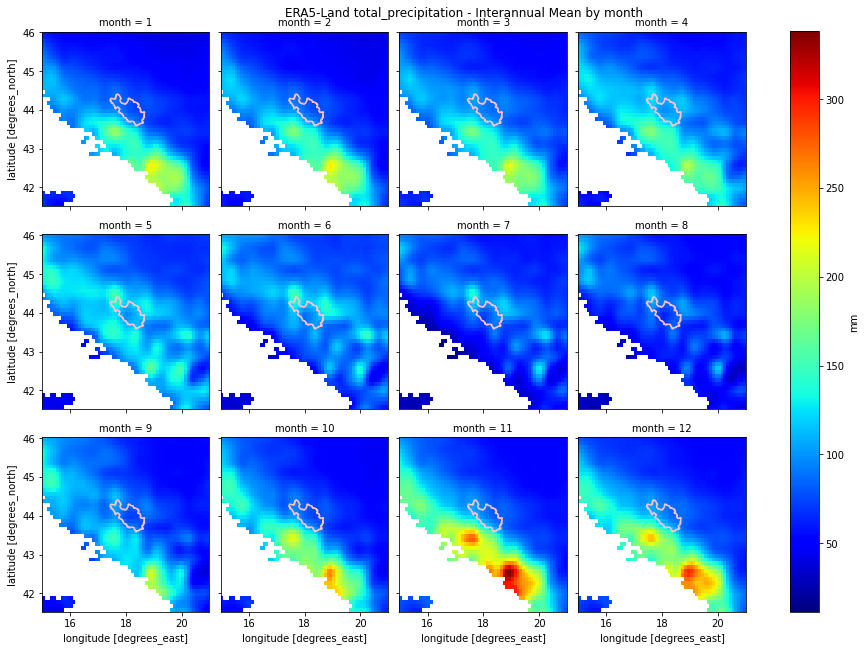

In [10]:
"""
Created on november 2020
@author: Loïc Duffar
"""
import matplotlib.pyplot as plt
import hvplot
import hvplot.pandas
import pandas as pd
from shapely.geometry import Polygon
import datetime
print('Hvplot version: ', hvplot.__version__)

pd.options.plotting.backend = "matplotlib"# restore default pandas backend (matplotlib) in case plotly have been substituate before

print('Process started. Please wait the ending message ... ')
start= datetime.datetime.now()# Start Timer

# ========= Compute/save/plot Interannual average
#---------- Compute annual sums/means AND averages the results over all years NB: EXCEPT the last year which is often the current/incomplete year
if param in param_mean:
    interannual_average = xarray_src[param].groupby('time.year').mean('time', skipna=False)[:-1].mean('year')
else:
    interannual_average = xarray_src[param].groupby('time.year').sum('time', skipna=False)[:-1].mean('year')

# ---------- Save the interannual raster to geotif file
interannual_average_file = dataset_name + ' interannual average'
interannual_average.rio.to_raster(os.path.join(folder_out, interannual_average_file + '.tif'))

# ---------- Display and save Plot of interannual map
# . . . . .  plot by HVPLOT
hv_plot1 = interannual_average.hvplot(x='longitude', y='latitude',
                                width= hvplot_width, height= hvplot_height, geo= True, project= True,# crs= proj, 
                                projection= proj,
                                # projection= cartopy.crs.Mercator(),# argument pour afficher la carte en Mercator qui est le système des fonds de carte web IMPOSé en python 311 (en mètre malheureusement)
                                coastline= res, 
                                # tiles= True,
                                # tiles= 'CartoLight', # CartoLight, StamenTerrain, StamenTerrainRetina, EsriTerrain, EsriNatGeo
                                cmap= cmap, clabel= units, title=dataset_name+' '+ variable + ' - Interannual average', alpha=0.6,
                                     )
hv_plot2 = interannual_average.hvplot.contour(x='longitude', y='latitude', geo= True, project= True, #crs= proj, 
                                              levels= nlevels, line_width=2, cmap='blues', alpha=1,
                                              projection= proj,
                                              # projection= cartopy.crs.Mercator(),
                                            )
df_points= pd.DataFrame(data= {'lat': [lat,], 'lon': [lon, ]})
hv_plot3 = df_points.hvplot.points(x= 'lon', y= 'lat', geo= True, color= 'red', alpha= 1, project= True,# crs= proj,
                                    projection= proj,
                                   # projection= cartopy.crs.Mercator()
                                    )

hv_plot = hv_plot1 * hv_plot2 * hv_plot3

if gdf_polyg is not None:
    hv_plot3 = gdf_polyg.hvplot(geo= True, line_color='magenta', fill_color='none', alpha=1.0, width= hvplot_width,  project= True,# crs= proj,
                                projection= proj,
                                # projection= cartopy.crs.Mercator(),
                               )
    hv_plot = hv_plot * hv_plot3
if gdf_wrapping is not None:
#    polygon = Polygon([(lon_min, lat_min), (lon_min, lat_max), (lon_max, lat_max), (lon_max, lat_min), (lon_min, lat_min)])
#    gdf_pol =  gpd.GeoDataFrame([1], geometry= [polygon], crs= proj)
#    gdf_wrapping = gpd.clip(gdf_wrapping, gdf_pol)# Fonction clip() non disponible dans la version 0.6.3 de geopandas
    hv_plot4 = gdf_wrapping.hvplot(geo= True, alpha=1, width= hvplot_width, color='none', project= True,# crs= proj,
                                    projection= proj,
                                   # projection= cartopy.crs.Mercator(), 
                                  )
    hv_plot = hv_plot * hv_plot4
hvplot.save(hv_plot, os.path.join(folder_out, interannual_average_file+'.html'), dpi=150, fmt= 'html') # provoque une erreur SOUS L'ENVIRONNEMENT VIRTUEL PYTHON39

'''
# . . . . .  plot by CARTOPY
display(interannual_average)
ax = plt.subplot( projection=proj)
plot = interannual_average.plot.pcolormesh('longitude', 'latitude', ax=ax)
#print(plot)
#ax = plt.gca()

ax.coastlines(resolution=res)
'''

# ========= Plot Mean by month maps (facet plot)
ds_by_month = xarray_src.groupby('time.month').mean('time')
grid = ds_by_month[param].plot(col= 'month', subplot_kws= dict(transform= proj ), 
                        col_wrap= 4, cmap= cmap, cbar_kwargs=dict(label= units))# ax= ax, 
for im in plt.gca().get_images():
    im.set_clim(xarray_src[param].min(), xarray_src[param].max())

for ax in grid.axes.flat:
    if gdf_polyg is not None: gdf_polyg.boundary.plot(ax=ax, edgecolor='pink', facecolor='none', alpha=1.0)
    if gdf_wrapping is not None: gdf_wrapping.boundary.plot(ax=ax, edgecolor='grey', facecolor='none', alpha=0.5, color='blue', linewidth=0.5,) 
plt.gcf().suptitle(dataset_name + ' ' + variable + ' - Interannual Mean by month', y=1)
mean_by_month_file = dataset_name + ' Interannual Mean by month.png'
plt.savefig(os.path.join(folder_out, mean_by_month_file), dpi=150)
print("Process completed in ", datetime.datetime.now()-start)
hv_plot

### <a name=section04></a>4) Plot and export monthly time serie for one pixel and for a possible polygon

- Run the file to export time series for the point and the possible polygon defined at cell 2

NB: An excel file is saved in the user defined output directory, and contains numeric timeseries (monthly and yearly), corresponding graphs as well as some maps

Plotly version:  5.5.0
INTERANNUAL MEAN: <xarray.DataArray 'tp' ()>
array(1148.33127252)
Coordinates:
    longitude  float32 17.94
    latitude   float32 44.17


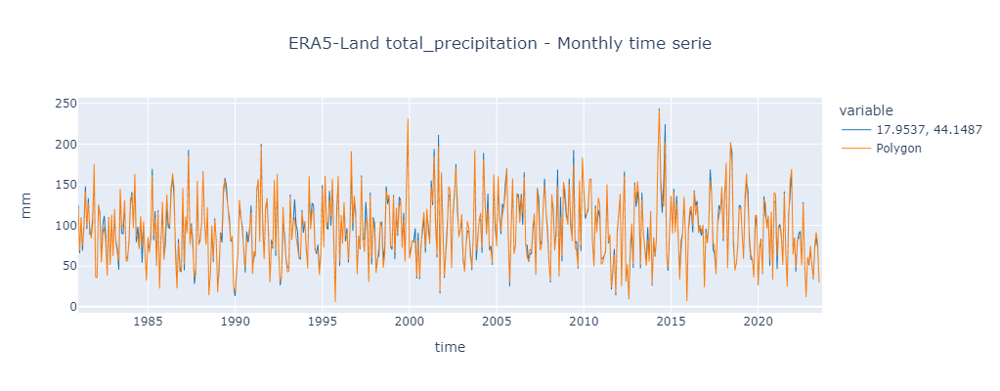

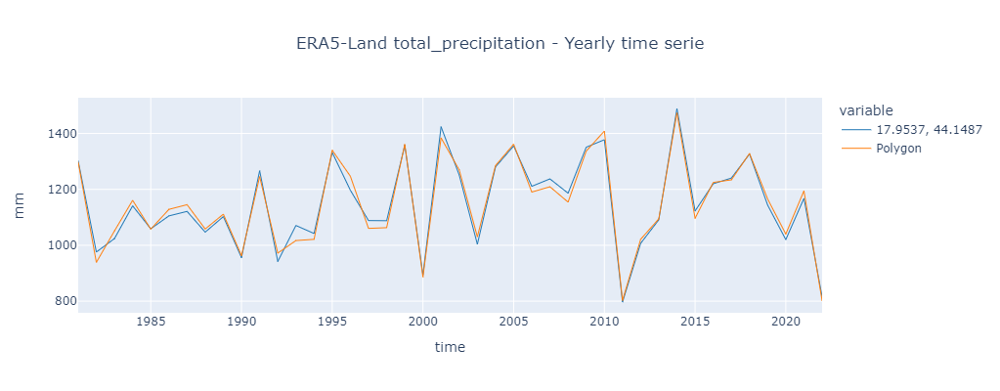

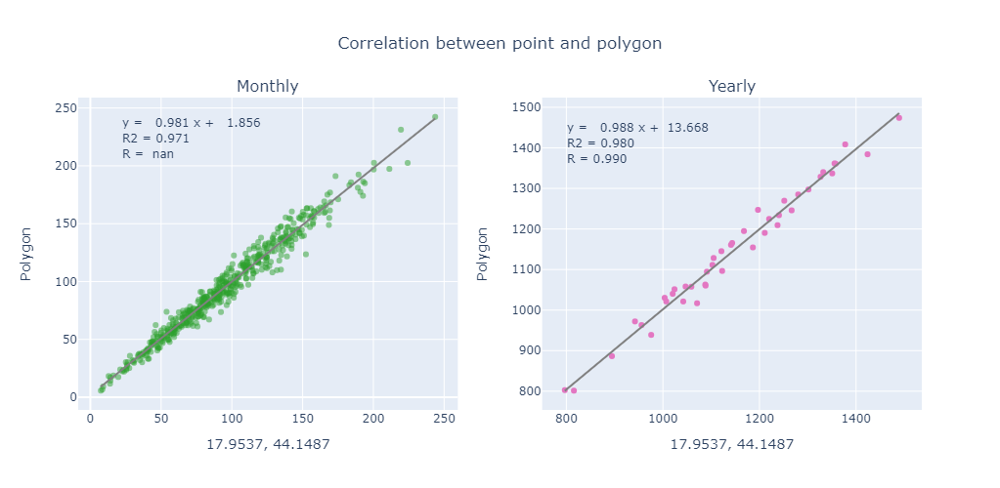

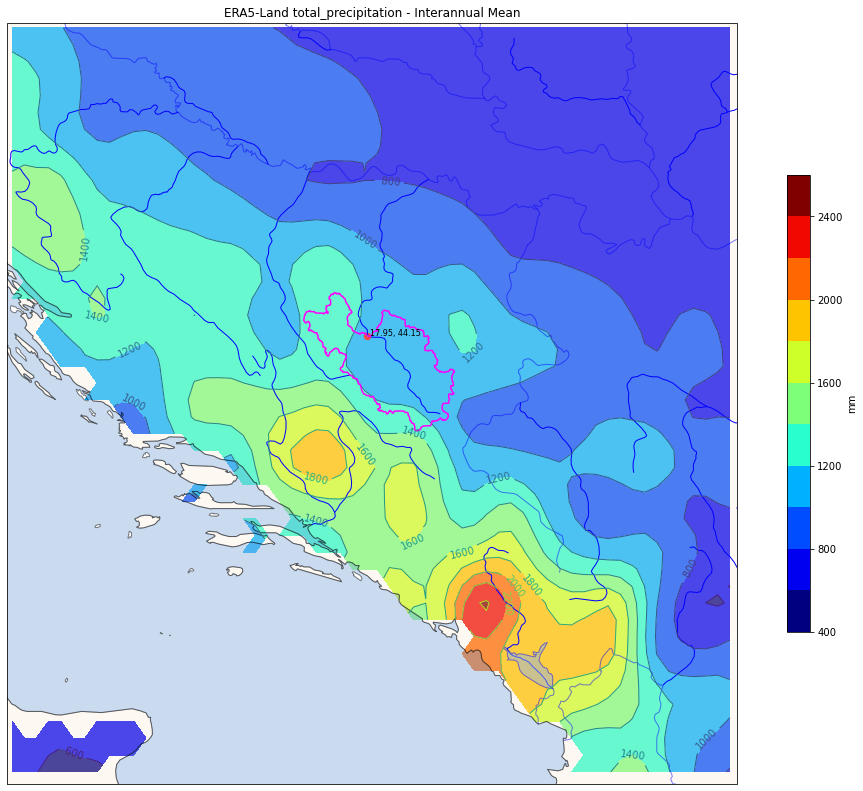

In [11]:
"""
Created on december 2020
@author: Loïc Duffar
"""
import numpy as np
import rasterstats
import cartopy.feature as cfeature
import plotly
import plotly.subplots   # ajout Jean MARTINI
import plotly.graph_objects as go
import plotly.express as px
import affine
print('Plotly version: ', plotly.__version__)

pd.options.plotting.backend = "plotly"# replace default pandas backend (matplotlib) by plotly

# ++++++++++ MONTHLY time series extraction (and computation of total by year and interannual average)
# ---------- ...from point
time_serie = xarray_src[param].sel(longitude=lon, latitude=lat, method="nearest", tolerance= pixel_size/2)# tolerance of 1/2 latitude and longitude step
if param in param_mean:
    time_serie_by_year = time_serie.groupby('time.year').mean('time')[:-1]
else:
    time_serie_by_year = time_serie.groupby('time.year').sum('time')[:-1]

print('INTERANNUAL MEAN:', time_serie_by_year.mean())

nround = 2
df = time_serie.to_dataframe().round(nround)
df.drop(labels=['latitude', 'longitude'], axis=1, inplace=True)
col_point = str(round(lon, 4)) + ', ' + str(round(lat, 4))
df.rename(columns= {param: col_point}, inplace=True)
'''
df2 = time_serie_by_year.to_dataframe().round(nround)
df2.drop(labels=['latitude', 'longitude'], axis=1, inplace=True)
df2.rename(columns= {param: col_point}, inplace=True)
'''
# ---------- ...from polygon
col_polyg = None
if gdf_polyg is not None:
    col_polyg = 'Polygon'
    affine_obj = affine.Affine(pixel_size, 0, xarray_src['longitude'][0].values, 0, -pixel_size, xarray_src['latitude'][0].values)
    ts_polyg = []
    for date in xarray_src['time'].values:
        date_string = str(date)[:10]
        raster = xarray_src[param].sel(time= date_string).values
        stats = rasterstats.zonal_stats(gdf_polyg, raster, affine=affine_obj, stats=['mean'], nodata=-999)
        if stats[0]['mean']== None:
            ts_polyg.append(None)# rendu nécessaire par le format Era5-Land-T qui conduit à mois Nan en cas d'année incomplète, qui étaient simplement absents avec l'ancienne version d'ERA5-Land
        else:
            ts_polyg.append(round(stats[0]['mean'], nround))
    df[col_polyg] = ts_polyg

# ++++++++++ YEARLY time series
if param in param_mean:
    df2 = df.groupby(df.index.year).mean()[:-1]
else:
    df2 = df.groupby(df.index.year).sum()[:-1]
#df2.rename_axis(index={'time': 'year'}, inplace=True)
#    df2[col_polyg] = ts_polyg_by_year
#    display(df2)
    
# +++++++++++ Rearrange monthly values into 12 monthly columns
tables = []
df['MONTH'] = df.index.month
df['YEAR'] = df.index.year
for par in [col_point, col_polyg]:
    if par is not None: 
        table = df[[par, 'MONTH', 'YEAR']]
        table = table.pivot_table(values= par, index='YEAR', columns='MONTH')    # convert long-form dataframe to wide-form
        if param in param_mean:
            table['Mean'] = table.apply(func=np.mean, axis='columns')            # compute and add annual average
        else:
            table['Total'] = table.apply(func=np.sum, axis='columns')            # compute and add annual sum
        avg = table.mean()                                                       # compute interannual average
        # table.append(avg.rename('Mean', inplace=True, axis='index'))             # add this average as a row of table
        table=pd.concat([table,avg.rename('Mean', inplace=True, axis='index')],axis=0)  # ajout Jean MARTINI
        tables.append(table)
df.drop(labels=['MONTH', 'YEAR'], axis=1, inplace=True)
    
# ++++++++++ plot time series
# .......... hvplot
#graph = time_serie.hvplot(title='Monthly timeserie',)                 
# .......... plotly (if backend has been change at the beginning)
colors= px.colors.qualitative.D3
prefix = dataset_name + ' '+ variable
fig = df.plot(width=950, height=400, labels={'value': units}, color_discrete_sequence= colors, 
              title=prefix+' - Monthly time serie')
fig2 = df2.plot(width=950, height=400, labels={'value': units}, color_discrete_sequence= colors, 
                title=prefix+' - Yearly time serie')
fig.update_layout(title_x=0.5, )
fig2.update_layout(title_x=0.5)
fig.update_traces(line_width=1)
fig2.update_traces(line_width=1)
if gdf_polyg is not None:
    fig3 = plotly.subplots.make_subplots(rows=1, cols=2, subplot_titles=("Monthly", "Yearly"))
    fig3.update_xaxes(title=col_point)
    fig3.update_yaxes(title=col_polyg)
    fig3.update_layout(height=500, width=900, showlegend=False, title_text="Correlation between point and polygon",
                      title_x=0.5)
    
    trace = go.Scatter(x=df[col_point], y=df[col_polyg], mode='markers', marker_color=colors[2], marker_opacity= 0.5)
    fig3.add_trace(trace, row=1, col=1)
    fig_trendline = px.scatter(df, x=col_point, y=col_polyg, trendline='ols', trendline_color_override='grey')
    fig3.add_trace(fig_trendline.data[1], row=1, col=1)
    results = px.get_trendline_results(fig_trendline)
    params = results.iloc[0]['px_fit_results'].params
    text = 'y = {:7.3f} x + {:7.3f}'.format(params[1], params[0])
    text= text + '<br>R2 = {:4.3f}'.format(results.iloc[0]['px_fit_results'].rsquared)
    text= text + '<br>R = {:4.3f}'.format(np.corrcoef(df[col_point], df[col_polyg])[0,1])
    fig3.add_annotation(x=0.05, y=0.95, xref= 'paper', yref= 'paper', text=text, showarrow= False, align= 'left')
    
    trace = go.Scatter(x=df2[col_point], y=df2[col_polyg], mode='markers', marker_color=colors[6])
    fig3.add_trace(trace, row=1, col=2)
    fig_trendline = px.scatter(df2, x=col_point, y=col_polyg, trendline='ols', trendline_color_override='grey')
    fig3.add_trace(fig_trendline.data[1], row=1, col=2)
    results = px.get_trendline_results(fig_trendline)
    params = results.iloc[0]['px_fit_results'].params
    text = 'y = {:7.3f} x + {:7.3f}'.format(params[1], params[0])
    text= text + '<br>R2 = {:4.3f}'.format(results.iloc[0]['px_fit_results'].rsquared)
    text= text + '<br>R = {:4.3f}'.format(np.corrcoef(df2[col_point], df2[col_polyg])[0,1])
    fig3.add_annotation(x=df2[col_point].min(), y=df2[col_polyg].max(), text=text, showarrow= False, row= 1,  col= 2, 
                        align= 'left', xanchor= 'left', yanchor= 'top')

monthly_graph_file = os.path.join(folder_out, dataset_name + ' monthly.png')
yearly_graph_file = os.path.join(folder_out, dataset_name + ' yearly.png')
correlation_graph_file = os.path.join(folder_out, dataset_name + ' correlation pixel_polygon-averaged.png')
fig.write_image(monthly_graph_file)
fig2.write_image(yearly_graph_file)
fig.show()
fig2.show()
fig.write_html(os.path.join(folder_out, dataset_name + '_graph_monthly.html'))
fig2.write_html(os.path.join(folder_out, dataset_name + '_graph_yearly.html'))
if gdf_polyg is not None:
    fig3.write_image(correlation_graph_file)
    fig3.show()

# ++++++++++ Plot interannual average map (again... but this one is exportable and it shows the pixel corresponding to timeserie)
#--------------- Options
fill_contours = True
plot_raingauges = True
raingauge_name = False
shape_files = True
#--------------- Plot and map setup
border = 0
x_ext = (lon_max - lon_min) * border
y_ext = (lat_max - lat_min) * border
proj = cartopy.crs.PlateCarree()
fig = plt.figure(figsize=(18, 14))
ax = fig.add_subplot(projection= proj)
ax.set_extent([lon_min-x_ext, lon_max+x_ext, lat_min-y_ext, lat_max+y_ext], crs=proj)
#--------------- plot contours
if fill_contours:
    cs1 = xr.plot.contourf(interannual_average, 'longitude', 'latitude', ax=ax, levels=nlevels+2, cmap=plt.cm.jet, alpha=1,
                          cbar_kwargs=dict(shrink=0.6, label=units))# contour fills
cs2 = xr.plot.contour(interannual_average, 'longitude', 'latitude', ax=ax, levels=nlevels+2, linewidths=1)# contour allows to plot contour lines (contourf does not) 
plt.clabel(cs2, fontsize=10, fmt='%4d', inline=True)
#cb = plt.colorbar(cs1, shrink=0.6)
#cb.set_label(units)
#--------------- Map customization (Polygon and shape file)
if gdf_polyg is not None: gdf_polyg.boundary.plot(ax=ax, edgecolor='magenta', facecolor='none', alpha=1.0)
if gdf_wrapping is not None: gdf_wrapping.plot(ax=ax, edgecolor='grey', facecolor='none', color='none', linewidth=0.5,) 
#--------------- plot the pixel point
plt.scatter(lon,lat, s=40, color='red')
text = '{:4.2f}'.format(lon)+', '+'{:4.2f}'.format(lat)
plt.annotate(text, (lon,lat), xytext=(3,0), textcoords='offset points', fontsize=8, color='black', \
             arrowprops=dict(arrowstyle='-', color='grey') )    
#--------------- Map wrapping (NaturalEarth)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', res, facecolor='antiquewhite', edgecolor='black'),\
                alpha=0.3)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', res, facecolor='none', 
                edgecolor='blue'), alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_europe', res, facecolor='none', edgecolor='blue'))
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'lakes', res, facecolor=cfeature.COLORS['water'], edgecolor='blue'), \
                alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'ocean', res, facecolor=cfeature.COLORS['water'], edgecolor='black'), \
                alpha=0.5)
#ax.add_feature(cfeature.NaturalEarthFeature('physical', 'coastlines', res, facecolor='none', edgecolor='black'))
#ax.coastlines(resolution=res)
plt.title((dataset_name + ' ' + variable + ' - Interannual Mean'), loc='center')
plt.savefig(os.path.join(folder_out, interannual_average_file+'.png'), dpi=150)

# ++++++++++ Save the data and graphs in excel file
excel_file = dataset_name + ' timeserie.xlsx'
writer = pd.ExcelWriter(os.path.join(folder_out, os.path.join(folder_out, excel_file)), engine= 'xlsxwriter')
workbook  = writer.book
#--------------- Single column
df.to_excel(writer, sheet_name='single_column', startrow=3, engine= 'xlsxwriter')
worksheet = writer.sheets['single_column']
worksheet.write('A1', 'Param.=')
worksheet.write('A2', 'Unit=')
worksheet.write('B1', param)
worksheet.write('B2', units)
if os.path.exists(monthly_graph_file):
    worksheet.insert_image('D1', monthly_graph_file)
if os.path.exists(yearly_graph_file):
    worksheet.insert_image('D20', yearly_graph_file)
if os.path.exists(os.path.join(folder_out, interannual_average_file+'.png')):
    worksheet.insert_image('D40', os.path.join(folder_out, interannual_average_file+'.png'))
if os.path.exists(os.path.join(folder_out, mean_by_month_file)):
    worksheet.insert_image('T1', os.path.join(folder_out, mean_by_month_file))
if os.path.exists(os.path.join(folder_out, facet_plot_subset_file)):
    worksheet.insert_image('AL1', os.path.join(folder_out,facet_plot_subset_file))
if os.path.exists(os.path.join(folder_out, annual_file)):
    worksheet.insert_image('AL40', os.path.join(folder_out, annual_file))
#--------------- One column by month
for col, table in zip([col_point, col_polyg], tables):
    table.to_excel(writer, sheet_name=col+'_by_month', startrow=3, engine= 'xlsxwriter') # save wide-form table
    worksheet = writer.sheets[col+'_by_month']

    worksheet.write('A1', 'Localisation=')
    worksheet.write('A2', 'Var.=')
    worksheet.write('A3', 'Unit=')
    worksheet.write('B1', col)
    worksheet.write('B2', param)
    worksheet.write('B3', units)
    chart = workbook.add_chart({'type': 'scatter', 'subtype': 'straight'})
    chart.add_series({'categories': "='"+col+"_by_month'!$A$5:$A$100",
                      'values': "='"+col+"_by_month'!$N$5:$N$100"})
    worksheet.insert_chart('O1', chart)
if gdf_polyg is not None:
    worksheet.insert_image('O16', os.path.join(folder_out, correlation_graph_file))
# writer.save()
workbook.close()# ajout Jean MARTINI

# ++++++++++ Delete image files already copied in excel file
if os.path.exists(monthly_graph_file):
    os.remove(monthly_graph_file)
if os.path.exists(yearly_graph_file):
    os.remove(yearly_graph_file)
if os.path.exists(os.path.join(folder_out, interannual_average_file+'.png')):
    os.remove(os.path.join(folder_out, interannual_average_file+'.png'))
if os.path.exists(os.path.join(folder_out, mean_by_month_file)):
    os.remove(os.path.join(folder_out, mean_by_month_file))
if os.path.exists(os.path.join(folder_out,facet_plot_subset_file)):
    os.remove(os.path.join(folder_out,facet_plot_subset_file))
if os.path.exists(os.path.join(folder_out, annual_file)):
    os.remove(os.path.join(folder_out, annual_file))
if os.path.exists(os.path.join(folder_out, correlation_graph_file)):
    os.remove(os.path.join(folder_out, correlation_graph_file))

### <a name=section05></a>5) Annual maps animation OPTIONNAL
Run the cell to plot annual maps animation

In [12]:
"""
Created on november 2020
@author: Loïc Duffar
"""
import hvplot

if param in param_mean:
    year_time_serie = xarray_src[param].groupby('time.year').mean(dim='time', skipna=False)[:-1]    
else:
    year_time_serie = xarray_src[param].groupby('time.year').sum(dim='time', skipna=False)[:-1]

hv_plot_year = year_time_serie.hvplot(x='longitude', y='latitude',
                        width=hvplot_width, height= hvplot_height, 
                        alpha=0.6, geo= True,  crs= proj, clim=(0, year_time_serie.max()),
                        widget_location="right", 
                        cmap='jet', clabel= units,
#                        coastline= res,
                        tiles='CartoLight', # https://holoviews.org/reference/elements/bokeh/Tiles.html
                                    #CartoLight, CartoMidnight, CartoEco, CartoDark, Wikipedia, OSM, 
                                    # EsriImagery, EsriNatGeo, EsrUSATopo, EsriTerrain, EsriReference, 
                                )   # StamenTerrain, StamenTerrainRetina, StamenWatercolor, StamenToner, StamenTonerBackground, StamenLabels
# if gdf_polyg is not None:
#     hv_plot_polygon = gdf_polyg.hvplot(geo= True,  crs= proj, alpha=1.0, line_color='magenta', color=None, width= hvplot_width)
#     hv_plot_year = hv_plot_year * hv_plot_polygon # unsupported operand type(s) for *: 'Row' and 'Polygons'
hv_plot_year
#hvplot.save(hv_plot_year, os.path.join(folder_out, 'dataset_name + '_Map_Animation_yearly.html'))# the script crashes, except by disabling the following argument of the hvplot method above: widget_location

Row
    [0] HoloViews(DynamicMap, widget_location='right')
    [1] Column
        [0] VSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='year', options=OrderedDict([('1981', ...]), value=1981, width=250)
        [2] VSpacer()

### <a name=section06></a>6) Montlhy maps animation OPTIONNAL
Run the cell to plot monthly maps animation

In [13]:
"""
Created on november 2020
@author: Loïc Duffar
"""
#....... raster plot by hvplot
#subset = xarray_src.tp.sel(time= date_list)
hv_plot_month = xarray_src[param].hvplot(x='longitude', y='latitude',
                        groupby="time",  # groups by time AND adds a widget for time
                        widget_type="scrubber",
                        widget_location="bottom",
                        width=hvplot_width, height= hvplot_height, 
                        alpha=0.6, geo= True,  crs= proj, clim=(xarray_src[param].min(), xarray_src[param].max()),
#                        coastline= res,
                        tiles='CartoLight', cmap= cmap, clabel= units,
                       )
hv_plot_month
#hvplot.save(hv_plot_month, os.path.join(folder_out, 'dataset_name + '_Map_Animation_monthly.html'))# the script crashes, except by disabling the following arguments of the hvplot method above: widget_type and widget_location>

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=512, width=550)
        [2] HSpacer()

### <a name=section07></a>7) Plot maps over 12 months for a specific year (and month map with basemap) OPTIONNAL
- Customize the year to plot (date for the first day)
- Run the cell to plot the maps

WARNING: 
- crash if the chosen year is not complete


Average value over polygon=  [{'mean': 112.30942436923151}]  mm


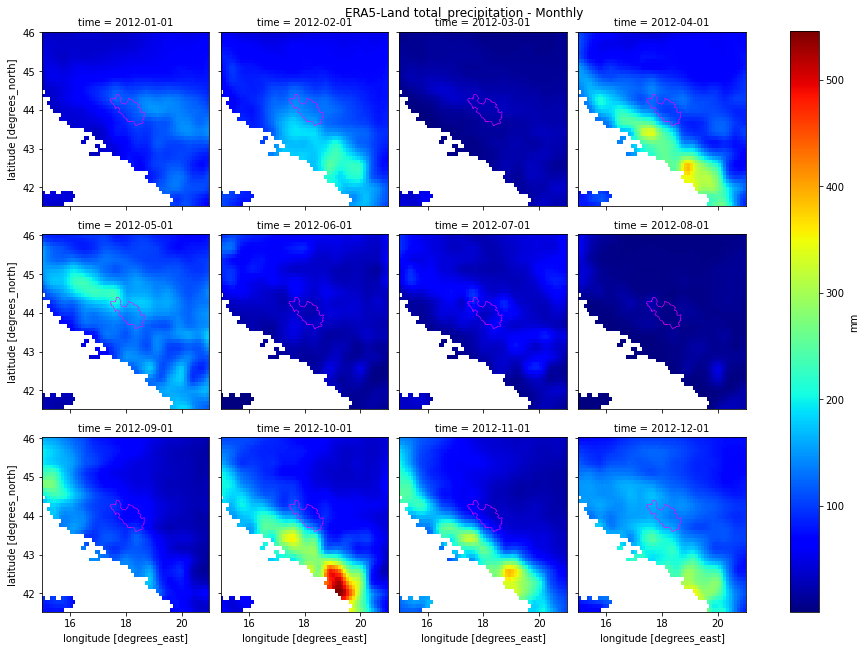

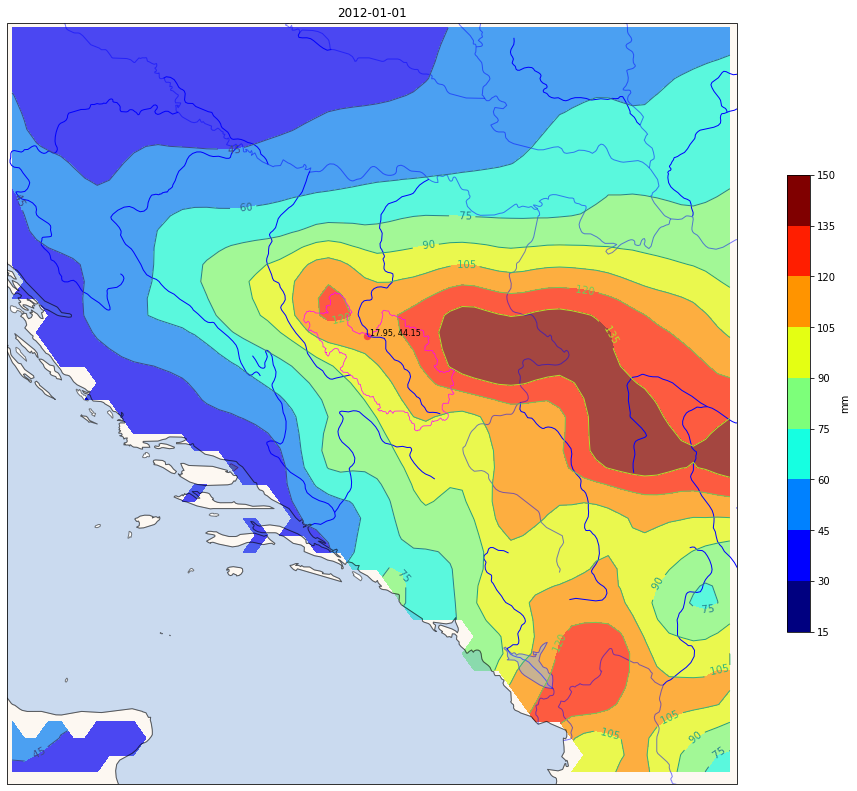

:Overlay
   .Image.I     :Image   [longitude,latitude]   (tp)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Contours.I  :Contours   [longitude,latitude]   (tp)
   .Polygons.I  :Polygons   [Longitude,Latitude]

In [14]:
import rasterstats
import geopandas as gpd
import cartopy.feature as cfeature
import matplotlib as mpl

# ++++++++++++++++ Customization
date_string = '2012-01-01'  # date string beginning by year with separator '-' (xarray format)

# ++++++++++++++++ Averaging pixels over polygon
if gdf_polyg is not  None:
    raster = xarray_src[param].sel(time= date_string).values
    affine_obj = affine.Affine(0.1, 0, xarray_src['longitude'][0].values, 0, -0.1, xarray_src['latitude'][0].values)
    result = rasterstats.zonal_stats(gdf_polyg, raster, affine=affine_obj, stats=['mean'], nodata= -999)
    print('Average value over polygon= ', result, ' '+units)

# ++++++++++++++++ PLOTTING
#---------------- RASTER plot by xarray with FACET (map wrapping not allowed for cartopy facet plot)
date_list = pd.date_range(start=date_string, freq='MS', periods=12)
#fig = plt.figure(figsize=[10, 8])
#ax = fig.add_subplot(1, 1, 1, projection=proj)
# TO BE FIXED : does not works if the year is not complete
facet_grid = xarray_src[param].sel(time= date_list).plot(col= 'time',# subplot_kws= dict(projection= proj), 
                                                         col_wrap= 4, cmap= cmap, cbar_kwargs={"label": units},
#                                                         transform= proj,
                                                        )# ax= ax, 
for ax in facet_grid.axes.flat:
    if gdf_polyg is not None: gdf_polyg.boundary.plot(ax=ax, edgecolor='magenta', facecolor='none', linewidth=0.5, alpha=1.)
    if gdf_wrapping is not None: gdf_wrapping.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=0.5, alpha=1., ) 
plt.gcf().suptitle(dataset_name + ' '+ variable + ' - Monthly', y=1)
#for i, axis in enumerate(facet_grid.axes.flat):
#    axis.coastlines(resolution=res)
plt.savefig(os.path.join(folder_out, facet_plot_subset_file), dpi=150)
mpl.interactive(True) # allows to show multiple plots
plt.show()

#--------------- CONTOUR plot by matplotlib/cartopy with map wrapping
border = 0
x_ext = (lon_max - lon_min) * border
y_ext = (lat_max - lat_min) * border
proj = cartopy.crs.PlateCarree()
fig = plt.figure(figsize=(18, 14))
ax = fig.add_subplot(projection= proj)
ax.set_extent([lon_min-x_ext, lon_max+x_ext, lat_min-y_ext, lat_max+y_ext], crs=proj)
#. . . . . . . . plot contours
if fill_contours:
    cs1 = xr.plot.contourf(xarray_src.sel(time= date_string)[param], 'longitude', 'latitude', levels=nlevels+2, 
                           cmap= cmap, alpha=1, cbar_kwargs=dict(shrink=0.6, label=units))# contour fills
cs2 = xr.plot.contour(xarray_src.sel(time= date_string)[param], 'longitude', 'latitude', levels=nlevels+2, 
                      linewidths=1)# contour allows to plot contour lines (contourf does not)
plt.clabel(cs2, fontsize=10, fmt='%4d', inline=True)
#cb = plt.colorbar(cs1, shrink=0.6)
#cb.set_label(units)
plt.scatter(lon,lat, s=40, color='red')
plt.annotate(text, (lon,lat), xytext=(3,0), textcoords='offset points', fontsize=8, color='black', \
             arrowprops=dict(arrowstyle='-', color='grey') ) 

#. . . . . . . . Map customization (Polygon and shape file)
if gdf_polyg is not None: gdf_polyg.boundary.plot(ax=ax, edgecolor='magenta', facecolor='none', linewidth=0.7, alpha=1)
if gdf_wrapping is not None: gdf_wrapping.plot(ax=ax, edgecolor='blue', facecolor='none', linewidth=0.7, alpha=1,) 

#. . . . . . . . Map wrapping (NaturalEarth)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', res, facecolor='antiquewhite', edgecolor='black'),
                alpha=0.3)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', res, facecolor='none', 
                edgecolor='blue'), alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_europe', res, facecolor='none', edgecolor='blue'))
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'lakes', res, facecolor=cfeature.COLORS['water'], edgecolor='blue'), 
                alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'ocean', res, facecolor=cfeature.COLORS['water'], edgecolor='black'), 
                alpha=0.5)
#ax.add_feature(cfeature.NaturalEarthFeature('physical', 'coastlines', res, facecolor='none', edgecolor='black'))
#ax.coastlines(resolution=res)
plt.title((date_string), loc='center')
plt.savefig(os.path.join(folder_out, annual_file), dpi=150)

'''
#---------------- RASTER plot by xarray plot method (theoricaly allowing cartopy wrapping, but a bug has to be resolved)
#img_extent = [lon_min, lon_max, lat_min, lat_max]
#ax.set_extent(img_extent, crs=proj)
#ax.imshow(array_src, origin='upper', extent=img_extent, transform=proj, cmap='jet_r', alpha=0.5)

#ax = plt.subplot(projection=cartopy.crs.PlateCarree())
fig, ax = plt.subplots(1, 1, figsize=(9,7), subplot_kw=dict(projection= proj) )
xarray_src[param].sel(time= date_string).plot(subplot_kws= dict(transform= proj),
                                                 add_colorbar= True, cmap= cmap)
plt.gcf().suptitle('ERA5 '+ variable + ' - Monthly averaged', y=0.95)

# Map wrapping (cartopy)
if df_wrapping is not None: ax.add_geometries(df_wrapping.geometry, crs=proj, facecolor='none', edgecolor='blue', alpha=1)
ax.coastlines(resolution=res)
#ax.add_feature(cfeature.NaturalEarthFeature(category='physical', name='land', scale= res, edgecolor='face', facecolor=cfeature.COLORS['land']), alpha=0.3)
ax.add_feature(cfeature.NaturalEarthFeature(category='physical', name='ocean', scale=res, facecolor=cfeature.COLORS['water'], edgecolor='none'), alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', res, facecolor='none', edgecolor='steelblue'))
#rasterstats.zonal_stats()
'''
plt.show()

#---------------- RASTER plot by hvplot (with basemap, contour lines and value display)
hv_plot1 = xarray_src[param].sel(time=(date_string)).hvplot(x='longitude', y='latitude', width=hvplot_width, height= hvplot_height, alpha=0.6, geo= True, 
                                                       coastline= res,
                                                        crs= proj, 
                                                            # tiles='CartoLight', 
                                                            cmap= cmap, clabel= units,)
hv_plot2 = xarray_src[param].sel(time=(date_string)).hvplot.contour(x= 'longitude', y= 'latitude', levels=nlevels, geo= True)
if gdf_polyg is not None:
    hv_plot3 = gdf_polyg.hvplot(geo= True,  crs= cartopy.crs.PlateCarree(), line_color='magenta', color= None, alpha=1)
if gdf_wrapping is not None:
    hv_plot4 = gdf_wrapping.hvplot(geo= True,  crs= cartopy.crs.PlateCarree(), line_color='blue', color= None, alpha=1)
if gdf_polyg is not None and gdf_wrapping is not None:
    hv_plot = hv_plot1 * hv_plot2 * hv_plot3 * hv_plot4
elif gdf_polyg is None and gdf_wrapping is not None:
    hv_plot = hv_plot1 * hv_plot2 * hv_plot4
elif gdf_polyg is not None and gdf_wrapping is None:    
    hv_plot = hv_plot1 * hv_plot2 * hv_plot3
elif gdf_polyg is None and gdf_wrapping is None:    
    hv_plot = hv_plot1 * hv_plot2
hv_plot

###  <a name=section08></a>8) Elevation map OPTIONNAL
The DEM tif file can be downloaded from WorldClim https://www.worldclim.org/data/worldclim21.html

Customize the code below before to run it:
- folder and name of the elevation raster file
- Min/Max elevations to anchor the color map

In [2]:
"""
Created on March 2021
@author: Loïc Duffar
"""
import hvplot.xarray
import hvplot.pandas
import xarray as xr
import rioxarray
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy
import cartopy.feature as cfeature
import hvplot.xarray

######### Customization
# ----------- DEM global TIF file (FOLDER WITHOUT "\" CHARACTER AT THE END !!!)
fld_elv= r'X:\1-COMMUN\DIS\Documentation\Hydrologie\Documentation externe\Climat Monde\WorldClim\Elevation'
file_elv= 'wc2.1_30s_elev.tif'
# -------- Min/Max values to anchor the color map
#          - vmin should be negative to avoid low land to be colored in blue
#          - vmax should be adjusted according to the relief (lower than max elevation in case of high montains, otherwise greater than or equal to the max)
vmin_elv, vmax_elv= (-50, 2800)

######### Initializations
proj = cartopy.crs.PlateCarree()
title= 'Elevation map'
file_out= 'WorldClim - Elevation Map.png'
cmap_terrain= 'terrain'

######### Process
# +++++++ Open file
da= rioxarray.open_rasterio(os.path.join(fld_elv, file_elv), masked= True)
da= da.sel(band= 1)

# +++++++ Clip data
da= da.rio.clip_box(lon_min, lat_min, lon_max, lat_max)

# +++++++ Rename x/y coordinates and set spatial dimensions to the new names
da= da.rename(dict(x= 'lon', y= 'lat'))
da.rio.set_spatial_dims(x_dim= 'lon', y_dim= 'lat', inplace= True)
da= da.reset_coords(names= ['band', 'spatial_ref'], drop=True)

# +++++++ Plot (cartopy)
plt.close()
#. . . . . . . . Plot elevation
da.plot.imshow(vmin= vmin_elv, vmax= vmax_elv,
#               cbar_kwargs= dict(shrink=0.6, label= 'Elv. (m)', pad=0.2),
               cmap= cmap_terrain, norm= mpl.colors.PowerNorm(0.3, clip=False), robust= True,
               cbar_kwargs= dict(shrink=0.6, label= 'Elv. (m)', aspect= 30),
               transform= proj, subplot_kws= dict(projection= proj),
              )
plt.gcf().set_size_inches(15, 12)
ax= plt.gca()

#. . . . . . . . Map custumization
plt.gcf().suptitle(title, y=1)
if gdf_polyg is not None:
    gdf_polyg.boundary.plot(ax=ax, edgecolor= 'magenta', facecolor= 'none', alpha= 1)
if gdf_wrapping is not None: 
    gdf_wrapping.plot(ax=ax, edgecolor= 'grey', facecolor= 'none', color= 'none', linewidth= 0.6, alpha= 1) 
plt.scatter(lon,lat, s=40, color='red')
plt.annotate(text, (lon,lat), xytext=(3,0), textcoords='offset points', fontsize=8, color='black', \
             arrowprops=dict(arrowstyle='-', color='grey') ) 

#. . . . . . . . Map wrapping (NaturalEarth)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', res, facecolor='none', 
                edgecolor='blue'), alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'rivers_europe', res, facecolor='none', edgecolor='blue'))
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'lakes', res, facecolor=cfeature.COLORS['water'], edgecolor='blue'), 
                alpha=0.5)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'ocean', res, facecolor= 'aliceblue', edgecolor='black'), 
                alpha= 1)
    
plt.savefig(os.path.join(folder_out, file_out), dpi=150)

# +++++++ Plot (hvplot)
hv_plot= da.hvplot(x='lon', y='lat', width= hvplot_width, height= hvplot_height, geo= True,  crs= proj,
                coastline= res, 
                # tiles=  'EsriTerrain', # CartoLight, StamenTerrain, StamenTerrainRetina, EsriTerrain, EsriNatGeo,  Wikipedia, OSM, StamenLabels, EsriReference
                cmap= cmap_terrain, clabel= 'm', alpha=0.6,
                title= title,
                clim=(-700, vmax_elv), 
         )
hv_plot2 = df_points.hvplot.points('lon', 'lat', geo=True, color='red', alpha= 1, )
if gdf_polyg is not None :
    hv_plot3= gdf_polyg.hvplot(x='lon', y='lat', geo= True,  crs= proj,
                line_width= 2, line_color= 'magenta', fill_color= 'none',
                # tiles=  'EsriReference', # CartoLight, StamenTerrain, StamenTerrainRetina, EsriTerrain, EsriNatGeo,  Wikipedia, OSM, StamenLabels, EsriReference
                clim=(-700, vmax_elv), 
         )
    hv = hv_plot * hv_plot2 * hv_plot3
else:
    hv = hv_plot * hv_plot2
hv